# Рынок заведений общественного питания Москвы.

**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Наша задача: подготовить исследование заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Шаг.  Общая информация.

In [1]:
#импортируем библиотеки
import pandas as pd
import numpy as np
from datetime import datetime as dt, timedelta
from matplotlib import pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
#откроем файл с данными и изучим общую информацию
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://...')
display(data.head(10))
display(data.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

In [3]:
#посмотрим, сколько уникальных названий заведений мы имеем
data['name'].nunique()

5614

**Описание данных**
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

В нашем датасете 8406 строк и информация о 5614 заведениях, тип данных соответствует значениям, изменение названий столбцов не требуется.
Можем приступать к предобработке.

## Шаг. Предобработка данных.

Выполним предобработку данных:
- Изучим, есть ли дубликаты в данных, поищем пропуски;
- Создадим столбец street с названиями улиц из столбца с адресом;
- Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

### Дубликаты

In [4]:
#проверим есть ли явные дубликаты
data.duplicated().sum()

0

In [5]:
#боремся с неявными дубликатами в названиях заведений - приводим значения к одинаковому регистру
data['name'] = data['name'].str.upper()
#проверим, есть ли изменения
data['name'].nunique()

5512

In [6]:
#проверим, есть ли совпадения по названию заведения и его адресом
print('Всего совпадений по названию и адресу заведения:', data.duplicated(subset=['name', 'address']).sum())

Всего совпадений по названию и адресу заведения: 3


In [7]:
#удалим дубликаты
data = data.drop_duplicates(subset=['name', 'address'])

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB


Явных дубликатов не обнаружено. Приведя названия заведений к одному регистру, мы сократили количество уникальных названий заведений на 102, при поиске невных дубликатов по названию и адресу заведения, нашли 3 совпадения и удалили дубликаты.

### Пропущенные значения

In [9]:
#Выведем количество пропущенных значений для каждого столбца
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

In [10]:
#посмотрим количество пропусков в % соотношении для каждого столбца
pd.DataFrame(round(data.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.500000
avg_bill,54.600000


Пропуски присутствуют в следующих столбцах: hours - режим работы(6.4%), seats - количество посадочных мест(43%), столбцы с ценовыми диапазонами - price, avg__bill, middle_avg_bill не заполнены больше, чем на половину( от 54.6% до 62.5%), наибольшее количество пропусков в столбце middle_coffee_cup (значение стоимости чашки капучино)- 93.6%.
Заполнять пропуски в данных средними или медианными значениями будет некорректно и сильно исказит результаты исследования, поэтому оставим все, как есть.

### Создание новых столбцов

In [11]:
#создадим столбец street с названиями улиц из столбца с адресом
def street_list(row):
    address = row['address'].split(', ')
    street_name = address[1]
    return street_name
data['street'] = data.apply(street_list, axis=1)

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [12]:
#посмотрим, сколько есть вариантов различных режимов работы, начиная с наиболее часто встречающихся
data['hours'].value_counts()

ежедневно, 10:00–22:00                                                  759
ежедневно, круглосуточно                                                730
ежедневно, 11:00–23:00                                                  396
ежедневно, 10:00–23:00                                                  310
ежедневно, 12:00–00:00                                                  254
                                                                       ... 
пн,вт 12:00–00:00; ср-сб 12:00–05:00; вс 12:00–00:00                      1
пн-ср 09:00–00:00; чт,пт 09:00–01:00; сб 10:00–01:00; вс 10:00–00:00      1
ежедневно, 11:00–00:30                                                    1
пн-пт 08:00–19:00; сб 10:00–18:00                                         1
пн-чт 11:00–00:30; пт 11:00–02:30; сб 12:00–02:30; вс 12:00–00:30         1
Name: hours, Length: 1306, dtype: int64

Режим работы заведения указаны везде по-разному, всего 1306 уникальных значений.

In [13]:
#с помощью метода fillna() заменим пропущенные значения в столбце hours на 'unknown' и презепишем его 
data['hours'] = data['hours'].fillna('unknown')

In [14]:
#создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно
def hours_24(row):
    hours = row['hours'].split(', ')
    if hours[0] == 'ежедневно' and hours[1] == 'круглосуточно':
        return True
    else:
        return False
data['is_24/7'] = data.apply(hours_24, axis=1)

In [15]:
#проверим, все ли значения учтены
data['is_24/7'].sum()

730

In [16]:
#выведем первые пять строк измененного датафрейма на экран
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Выводы

Мы завершили предобработку данных, явные дубликаты обнаружены не были, но мы сократили количество уникальных названий заведений на 102, приведя их к одному регистру и удалили дубликаты, найденные по названию и адресу объекта. Нашли пропущенные значения и аргументировали, что их заполнение будет некорректным. Также мы выделили столбцы с названием улицы и круглосуточным режимом работы, всего круглосуточно и ежедневно работает 730 заведений Москвы.

## Шаг. Анализ данных.

### Категории заведений

In [17]:
#исследуем, какие категории заведений общественного питания представлены в данных, посмотрим на их количество
type_rest = data['category'].value_counts().reset_index()
type_rest

,index,category
0,кафе,2377
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


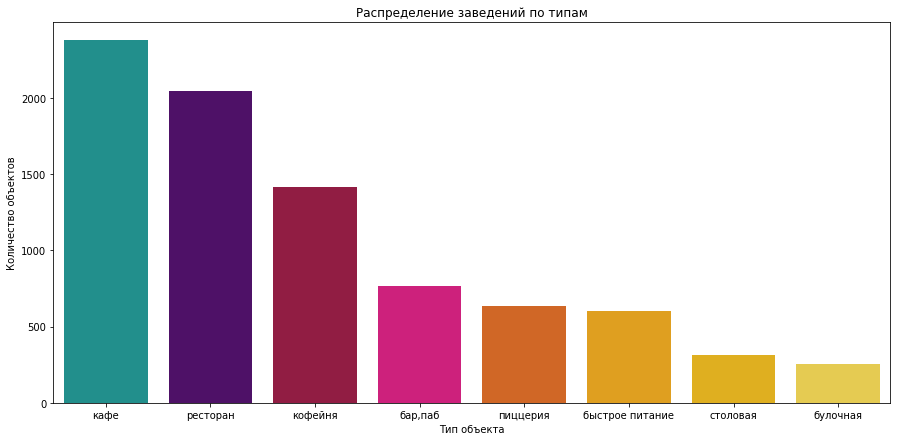

In [18]:
#визуализируем данные
my_colors = ['#10A19D','#540375','#A40A3C','#EA047E','#EC610A','#FFA900','#FFBF00','#FEDB39']
plt.figure(figsize=(15, 7))
sns.barplot(x='index', y='category', data=type_rest, palette=my_colors)
plt.xlabel('Тип объекта')
plt.ylabel('Количество объектов')
plt.title('Распределение заведений по типам')
plt.show()

In [19]:
#визуализируем доли с помощью круговой диаграммы
fig = go.Figure(data=[go.Pie(labels=type_rest['index'], values=type_rest['category'])])
fig.update_traces(marker=dict(colors=['#10A19D','#540375','#612147','#A40A3C','#EC610A','#FFA900','#FFBF00','#FEDB39']))
fig.show()

В наших данных представлены 8 категорий заведений: 

- больше всего кафе - 2377 (28.3%)
- ресторанов - 2042 (24.3%)
- кофеен - 1413 (16.8%)
- баров и пабов - 764 (9.1%)
- пиццерий - 633 (7.53%)
- заведений быстрого питания - 603 (7.17%)
- меньше всего столовых и булочных - 315 и 256 (3.75% и 3.05% соответственно).

### Количество посадочных мест

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.

In [20]:
#посмотрим общее распределение посадочных мест по всем категориям
data['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Медианно значение посадочных мест по всем категриям - 75, мы видим, что есть выбросы и значения выше 1000 мест. Теперь рассмотрим на каждую категория по отдельности.

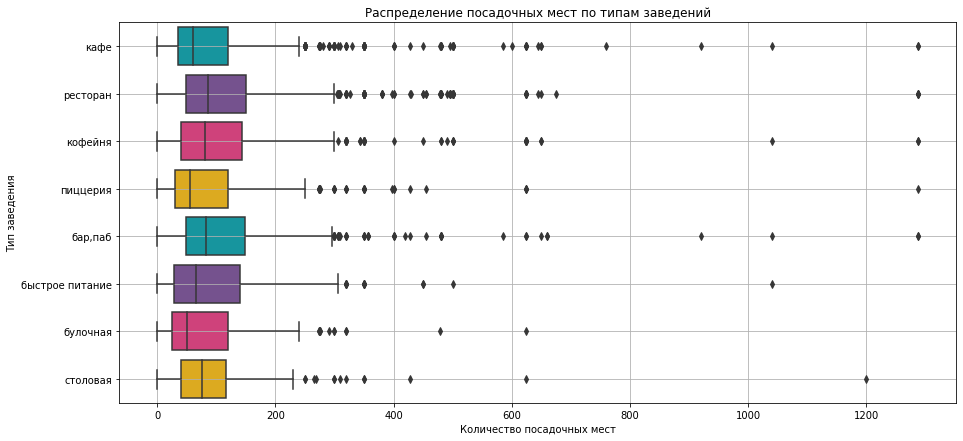

In [21]:
#построим боксплоты по количеству посадочных мест в разрезе по категориям
my_colors_2 = ['#00A8B5','#774898','#E62A76','#FBB901']
plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='category', data=data, palette=my_colors_2) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('Тип заведения')
plt.xlim()
plt.grid()
plt.title('Распределение посадочных мест по типам заведений')
plt.show()

Выбросы есть по всем категориям заведений, в ресторанах обычно количество псадочных мест больше, что логично для специфики заведения.

In [22]:
#сгруппируем данные по количеству мест в разных категориях, посчитаем медианное значение
seats_count = data.groupby('category').agg({'seats' : 'median','name' : 'count'}).reset_index()
seats_count.columns = ['object_type', 'seats_median', 'total_count']
seats_count = seats_count.sort_values(by='seats_median', ascending=False)
seats_count

,object_type,seats_median,total_count
6,ресторан,86.0,2042
0,"бар,паб",82.0,764
4,кофейня,80.0,1413
7,столовая,75.5,315
2,быстрое питание,65.0,603
3,кафе,60.0,2377
5,пиццерия,55.0,633
1,булочная,50.0,256


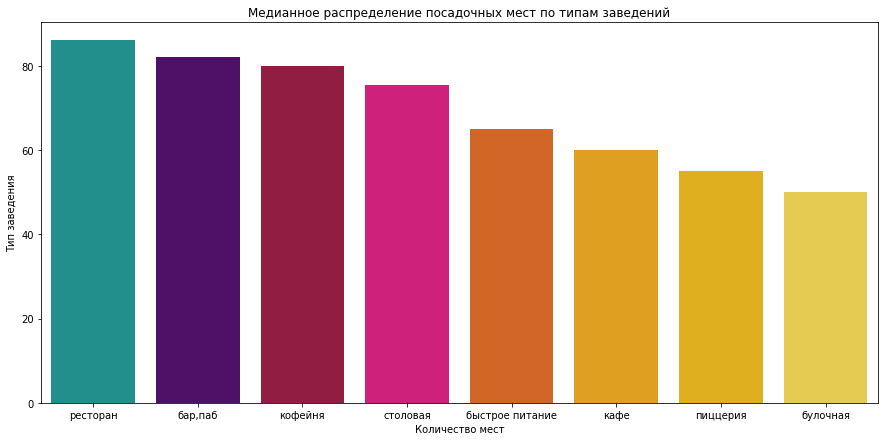

In [23]:
#визуализируем медианные значения
plt.figure(figsize=(15, 7))
sns.barplot(x='object_type', y='seats_median', data=seats_count, palette=my_colors)
plt.xlabel('Количество мест')
plt.ylabel('Тип заведения')
plt.title('Медианное распределение посадочных мест по типам заведений')
plt.show()

В среднем по заведениям следующая картина: в ресторанах и барах самое большое количество мест - 86 и 82 соответственно, в кофейнях 80, в столовых 75 мест, в фастфудах и кафе 65 и 60 мест и меньше всего в пиццериях и булочных - по 55 и 50 мест соответственно.

### Сетевые и несетевые заведения

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [24]:
#посчитаем количество 
chain_group = data['chain'].value_counts().reset_index()
chain_group.columns = ['chain', 'count']
chain_group

,chain,count
0,0,5200
1,1,3203


In [25]:
#визуализируем данные
fig = go.Figure(data=[go.Pie(labels=chain_group['chain'].map({1: 'Доля сетевых заведений', 0: 'Доля несетевых заведений'}), 
                             values=chain_group['count'], 
                             pull=[0,.2],
                             title='Распределение сетевых и несетевых заведений')])
fig.update_traces(marker=dict(colors=['#612147','#FFA900']))
fig.show()

Несетевых заведений больше - 5200, что составляет 61.9% от общего числа, сетевых заведений  - 3203, их доля 38.1%.

Посмотрим, какие категории заведений чаще являются сетевыми?

In [26]:
#создадим сводную таблицу со столбцами: тип заведения, всего заведений в категории, из них сетевые
chain = (data
         .pivot_table(index='category', values='chain', aggfunc=('count', 'sum'))
         .reset_index()
         .sort_values(by='count', ascending=False)
        )
#переименуем столбцы
chain.columns = ['category', 'total_count', 'chain_count']
#добавим столбец с количеством несетевых заведений
chain['unchain'] = chain['total_count'] - chain['chain_count']
#посчитаем доли сетевых и несетевых заведений в %
chain['percentage'] = chain['chain_count']/chain['total_count'] * 100
chain['percentage_2'] = chain['unchain']/chain['total_count'] * 100
chain

,category,total_count,chain_count,unchain,percentage,percentage_2
3,кафе,2377,779,1598,32.772402,67.227598
6,ресторан,2042,729,1313,35.700294,64.299706
4,кофейня,1413,720,693,50.955414,49.044586
0,"бар,паб",764,168,596,21.989529,78.010471
5,пиццерия,633,330,303,52.132701,47.867299
2,быстрое питание,603,232,371,38.474295,61.525705
7,столовая,315,88,227,27.936508,72.063492
1,булочная,256,157,99,61.328125,38.671875


In [27]:
#визуализируем данные с помощью plotly
fig = go.Figure()
fig.add_trace(go.Bar(x = chain['category'], y = chain['unchain'], marker_color='#612147', name='Несетевые заведения', 
                     text=chain['percentage_2'].apply(lambda x: '{0:1.2f}%'.format(x))))
fig.add_trace(go.Bar(x = chain['category'], y = chain['chain_count'], marker_color='#FFA900', name='Сетевые заведения', 
                     text=chain['percentage'].apply(lambda x: '{0:1.2f}%'.format(x))))
fig.update_layout(
    title='Распределение сетевых и несетевых заведение по категориям',
    title_x = 0.5,
    xaxis_title='Тип заведения',
    yaxis_title='Количество заведений',
    barmode='stack',
)

fig.show()

Сетевые заведения среди булочных встречаются чаще, чем в других категориях, а именно  61% из них являются таковыми. Около 50% всех кофеен и пиццерий тоже сетевые. При этом, по абсолютному количеству среди сетей лидируют кафе - 779 заведений, рестораны - 729 и кофейни - 720. Бары,пабы и столовые реже прочих являются сетевыми - лишь 22% и 28% соответственно. 

### Топ-15 популярных сетевых заведений Москвы

In [28]:
#посмотрим на популярные сетевые заведения, сгруппировав данные по названиям
data['name'].value_counts().head(25)

КАФЕ                                   189
ШОКОЛАДНИЦА                            120
ДОМИНО'С ПИЦЦА                          77
ДОДО ПИЦЦА                              74
ONE PRICE COFFEE                        72
ЯНДЕКС ЛАВКА                            69
COFIX                                   65
PRIME                                   50
ХИНКАЛЬНАЯ                              44
ШАУРМА                                  43
КОФЕПОРТ                                42
КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ     39
ТЕРЕМОК                                 38
ЧАЙХАНА                                 37
РЕСТОРАН                                34
БУХАНКА                                 32
COFEFEST                                32
СТОЛОВАЯ                                28
МУ-МУ                                   27
DRIVE CAFÉ                              24
КОФЕМАНИЯ                               23
АНДЕРСОН                                22
КРОШКА КАРТОШКА                         22
FRENCH BAKE

Мы видим, что в топ-15 попали не только сетевые заведения, но и объединенные под один тип заведения, у которых не было названий, например: кафе, хинкальная, шаурма, чайхана, ресторан. Уберем их из нашего топа и выведем новый список вместе с категориями. 

In [29]:
#формируем топ-15
data_chain = data.query('name not in ["КАФЕ", "ХИНКАЛЬНАЯ", "ШАУРМА", "ЧАЙХАНА", "РЕСТОРАН", "СТОЛОВАЯ"]')
top_chain = data_chain[['name', 'category']].value_counts().head(15).reset_index()
top_chain.rename(columns={0:'count'}, inplace=True)
top_chain

,name,category,count
0,ШОКОЛАДНИЦА,кофейня,119
1,ДОМИНО'С ПИЦЦА,пиццерия,77
2,ДОДО ПИЦЦА,пиццерия,74
3,ONE PRICE COFFEE,кофейня,72
4,ЯНДЕКС ЛАВКА,ресторан,69
5,COFIX,кофейня,65
6,PRIME,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,39
9,ТЕРЕМОК,ресторан,36


In [31]:
#визуализируем таблицу
fig = px.bar(top_chain, x='count', y='name', color='category', color_discrete_sequence=px.colors.qualitative.Bold)
fig.update_layout(title='Топ-15 сетевых заведений',
                   xaxis_title='Количество заведений сети',
                   yaxis_title='Название сети',
                   yaxis={'categoryorder':'total descending'})
fig.show()

Самым крупным сетевым заведением Москвы является кофейня Шоколадница - 119 заведений. Также в первой тройке представлены две пиццерии - Додо Пицца и Домино'с. Из нашего топ-15 целых шесть заведений приходится на категорию "кофейни". К категории рестораны имеются некоторые вопросы, в ней представлена Яндекс Лавка, что по сути не совсем заведение, а доставка готовой еды. Также в категории рестораны мы видим Теремок, который скорее относится к "быстрому питанию". Бары,пабы и столовые в топ-15 не вошли.

### Распределение заведений по районам Москвы

Посмотрим, какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [32]:
#посчитаем количество заведений в каждом районе
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [33]:
#построим сводную таблицу с группировкой по округам и количеством заведений в каждой категории
district_group = (data
                  .pivot_table(index='district', values='name', columns='category', aggfunc=('count'))
                  .reset_index()
                  )
district_group['total'] = district_group.loc[:, 'бар,паб':'столовая'].sum(axis=1)
district_group = district_group.sort_values(by='total', ascending=False)
district_group

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242
2,Северный административный округ,68,39,58,235,193,77,188,41,899
8,Южный административный округ,68,25,85,264,131,73,202,44,892
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
1,Западный административный округ,50,37,62,238,150,71,218,24,850
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


In [34]:
#визуализируем таблицу
fig = px.bar(district_group, x=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'], 
             y='district',
             color_discrete_sequence=px.colors.qualitative.Bold)
fig.update_layout(title='Распределение категорий заведений по районам Москвы',
                   xaxis_title='Округ',
                   yaxis_title='Количество заведений')
fig.show()

В нашем датасете представлены данные о заведениях в 9 округах Москвы. Самый многочисленный по заведениям округ - Центральный, там их насчитывается 2242. Что вполне логично, обычно в центре сосредоточена вся культурно-развлекательная жизнь. Больше всего в центре ресторанов - 670, имеется много кафе и кофеен, а также сосредоточено подавляющее большинство баров и пабов города. Самым малочисленным по заведениям оказался Северо-Западный округ, здесь их всего 409. В остальных районах города распределение заведений достаточно равномерное, 700 - 900 на округ.

### Рейтинги

Визуализируем распределение средних рейтингов по категориям заведений и посмотрим сильно ли различаются усреднённые рейтинги в разных типах общепита.

In [35]:
#сгруппируем заведения по категориям и посчитаем средний рейтинг
rating_group = (data
                .groupby('category')['rating'].mean()
                .round(2)
                .sort_values(ascending=False)
                .to_frame()
               )
rating_group

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


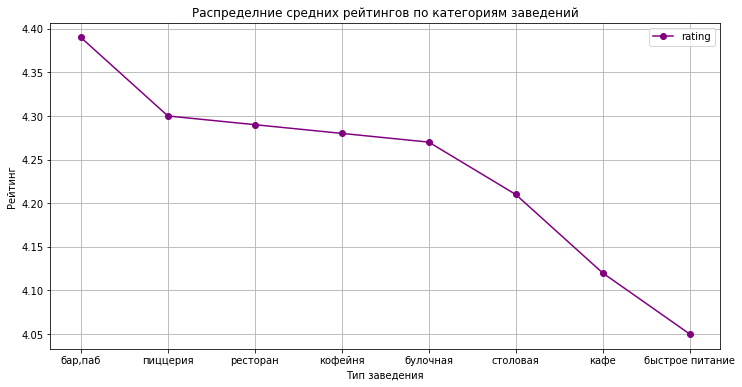

In [36]:
#построим график для наглядности
rating_group.plot(grid=True, figsize=(12,6),style='o-', color='purple')
plt.xlabel('Тип заведения')
plt.ylabel('Рейтинг')
plt.title('Распределние средних рейтингов по категориям заведений')
plt.show()

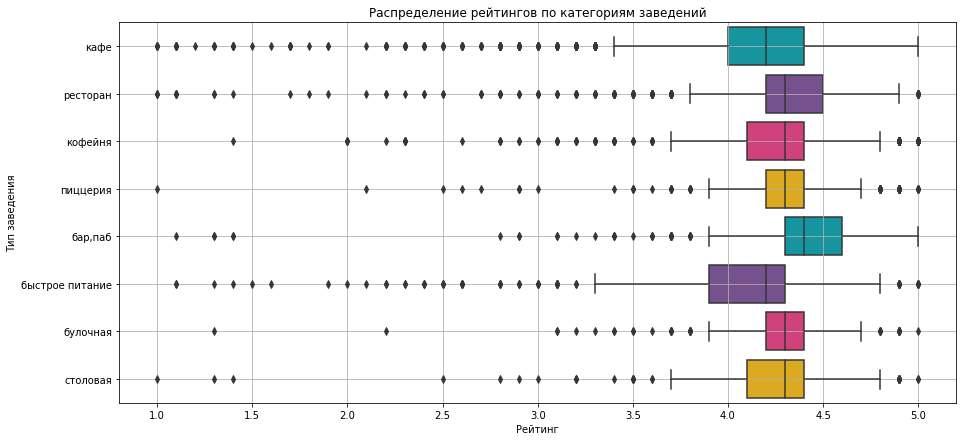

In [39]:
#построим боксплоты
plt.figure(figsize=(15, 7))
sns.boxplot(x='rating', y='category', data=data, palette=my_colors_2) 
plt.xlabel('Рейтинг')
plt.ylabel('Тип заведения')
plt.xlim()
plt.grid()
plt.title('Распределение рейтингов по категориям заведений')
plt.show()

Самый высокая средняя оценка в рейтинге у баров и пабов - 4.4, скорее всего дело в том, что люди в бар идут веселиться и выпивать по вечерам в хорошей компании, отсюда и рейтинги выше. Рестораны, кофейни, пиццерии и булочные имеют примерно равную среднюю оценку 4.3. У столовых оценка уже ниже - 4.2, самый низкий рейтинг у кафе и заведений быстрого питания - оценка 4.1.

### Визуализация данных на карте Москвы

#### Фоновая картограмма со средним рейтингом заведений каждого района

In [40]:
#посчитаем средние рейтинги для каждого района
rating_df = (data
             .groupby('district')['rating'].mean()
             .round(2)
             .sort_values(ascending=False)
             .reset_index()
            )
rating_df

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [41]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [42]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг с оценкой 4.4 у заведений в Центральном округе, худшая средняя оценка 4.1 - в Юго-Восточном административном округе. Остальные округа очень схожи по оценкам, средняя составляет около 4.2.

#### Изображение всех заведений на карте Москвы с помощью кластеров

In [43]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

На карте отчетливо видно, что плотность заведений в Центральном округе (внутри Третьего транспортного кольца) значительно выше. На юге и северо-западе плотность меньше средней.

### Анализ улиц с наибольшим и наименьшим количеством заведений

#### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам.

In [44]:
#формируем топ-15 улиц
top_street = data['street'].value_counts().head(15).reset_index()
top_street.columns = ['street', 'count']
top_street

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [45]:
#сохраняем сводную таблицу с подсчетом заведений на каждой улице с разбивкой по категориям
street_cnt = data.pivot_table(index='street', values='name', columns='category', aggfunc=('count'))

In [46]:
#объединяем две таблицы, чтобы оставить только улицы из топ-15
top_street_cnt = top_street.merge(street_cnt, how='inner', on='street')
top_street_cnt

,street,count,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,183,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,122,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,108,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,107,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,95,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,88,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,77,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,76,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,70,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
9,МКАД,65,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


In [47]:
#визуализируем данные
fig = px.bar(top_street_cnt, x='street', 
             y=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'],
             color_discrete_sequence=px.colors.qualitative.Bold)
fig.update_layout(title='Топ-15 улиц по количеству заведений',
                   xaxis_title='Название улицы',
                   yaxis_title='Количество заведений')
fig.show()

Если посмотреть на карту Москвы, то можно заметить, что больше всего заведений расположено на самых длинных улицах, проспектах, шоссе, которые начинаются от Садового кольца и уходят к краям города, проходят по нескольким районам. Выделяется сравнительно небольшая (относительно шоссе и проспектов) - Пятницкая улица в замоскворечье, где сосредоточено много ресторанов и баров.

#### Улицы с одним объектом общественного питания

In [48]:
#выделим улицы с одним объектом общепита
low_street = data.groupby('street')['name'].count().reset_index().query('name == 1')
low_street.rename(columns={'name':'count'}, inplace=True)
low_street

,street,count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


Всего 458 улиц с одним заведением общепита. Рассмотрим ниже их распредение по районам города.

In [49]:
#создадим временную таблицу для объединения, чтобы посмотреть распределение улиц с одним заведением по категориям
df = data[['category', 'street']].reset_index()

In [50]:
#объединим две таблицы и посчитаем, сколько улиц с одним объектом в каждом категории
category_street = low_street.merge(df, how='inner', on='street')
category_street = (category_street
                   .groupby('category')['street'].count()
                   .sort_values(ascending=False)
                   .reset_index()
                  )
category_street

,category,street
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


Чаще всего на таких улицах встречаются "одиночные" кафе, рестораны и кофейни входят в первую тройку.

In [51]:
#сохраним отдельно таблицу с названием округа и улицы для дальнейшего объединения
ds = data[['district', 'street']].reset_index()

In [52]:
#объединим две таблицы и посчитаем, сколько улиц с одним объектом в каждом округе
district_street = low_street.merge(ds, how='inner', on='street')
district_street = (district_street
                   .groupby('district')['street'].count()
                   .sort_values(ascending=False)
                   .reset_index()
                  )
district_street

,district,street
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


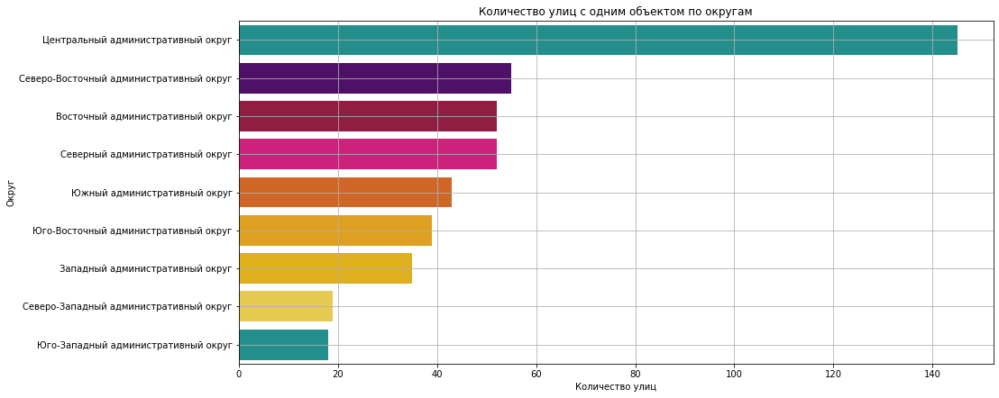

In [53]:
#построим график
plt.figure(figsize=(15, 7))
sns.barplot(x='street', y='district', data=district_street, palette=my_colors) 
plt.xlabel('Количество улиц')
plt.ylabel('Округ')
plt.grid()
plt.title('Количество улиц с одним объектом по округам')
plt.show()

Всего на 458 улицах в предоставленных данных располагается по одному объекту, кафе среди них встречаются чаще всего - 160 заведений. Треть из этих улиц - маленькие переулки и улицы в центре города. По остальным округам распределение достаточно равномерное, меньше всего улиц с одной точкой общественного питания в Северо-Западном и Юго-Западном округах.

### Средний чек

Проанализируем средние чеки в разных районах Москвы, для этого возьмем медианное значение столбца middle_avg_bill по каждому району. Затем построим фоновую картограмму с полученными значениями, которые возьмем в качестве ценового индикатора района.

In [54]:
#посмотрим на средний счет в разрезе районов
avg_bill = (data
            .groupby('district')['middle_avg_bill'].median()
            .reset_index()
            .sort_values(by = 'middle_avg_bill', ascending=False)
           )
avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [55]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний чек в заведениях по районам Москвы',
).add_to(m)

# выводим карту
m

Самый высокий средний чек мы видим в Центральном и Западном административных округах - 1000 руб. С центром города все понятно: много туристов, высокая аренда, высокий уровень обслуживания ввиду большой конкуренции - все это делает центр города более дорогим. В Западном округе расположены престижные районы Москвы (например, Раменки и Крылатское), что тоже вносит коррективы в средний чек и равняет район по ценообразованию к центру города. Наиболее доступные по ценам Юг, Юго-Восток и Северо-Восток города, там средний чек около 450-500 рублей.

### Влияние среднего чека на рейтинг

Давайте посмотрим на категории цен, высокий и низкий средний чек, это сколько? Есть ли зависимость между средним чеком в заведении и его рейтингом? Может быть чем, дороже, тем лучше? Или наоборот?

In [56]:
#посмотрим на категории цен
data.groupby('price')['middle_avg_bill'].median()

price
высокие          2000.0
выше среднего    1250.0
низкие            180.0
средние           500.0
Name: middle_avg_bill, dtype: float64

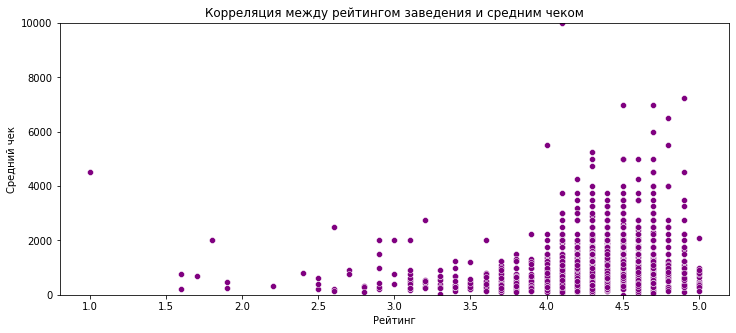

In [57]:
#построим диаграмму рассеяния
plt.figure(figsize=(12, 5))
sns.scatterplot(x='rating', y='middle_avg_bill', data=data, color='purple')
plt.title('Корреляция между рейтингом заведения и средним чеком') 
plt.xlabel('Рейтинг') 
plt.ylabel('Средний чек') 
plt.ylim(0,10000)
plt.show()

In [58]:
#считаем коэффициент корреляции
rating_corr = data['rating'].corr(data['middle_avg_bill'])
print('Коэффициент корреляции между рейтингами заведений и средним чеком:', rating_corr)

Коэффициент корреляции между рейтингами заведений и средним чеком: 0.18323797147624563


Мы не можем сказать, что между средним чеком и рейтингом заведения есть значимая зависимость. Однако, видим, что у заведений с высоким средним чеком реже бывают плохие оценки. Рассмотрим заведения с низкими рейтингами более пристально, к каким категориям они чаще всего относятся, какой у них средний чек?

In [59]:
#сделаем срез по заведениям с рейтингом ниже 3.5
#сгруппируем данные по категориям со стобцами: количество заведений в категории и средний чек
a = data.query('rating < 3.5').groupby('category').agg({'name' : 'count', 'middle_avg_bill': 'median'}).reset_index()
a.rename(columns={'name':'count', 'middle_avg_bill':'low_rating_bill'}, inplace=True)

In [60]:
#cоздадим вторую таблицу, сгруппируем по категориям заведений и средним чеком
b = data.groupby('category')['middle_avg_bill'].median().reset_index()

In [61]:
#объединим две таблицы и выведем: категория заведения, количество заведений с рейтингом ниже 3.5,
#средний чек заведений с рейтингом ниже 3.5, средний чек по всему датасету в данной категории
low_rating_rest = a.merge(b, how='inner', on='category')
low_rating_rest

,category,count,low_rating_bill,middle_avg_bill
0,"бар,паб",15,150.0,1250.0
1,булочная,8,612.5,450.0
2,быстрое питание,65,300.0,375.0
3,кафе,214,562.5,550.0
4,кофейня,45,550.0,400.0
5,пиццерия,10,900.0,600.0
6,ресторан,66,975.0,1250.0
7,столовая,11,262.5,300.0


Чаще всего заведения с низким рейтингом (ниже 3.5) встречаются среди кафе, при этом средний чек в кафе с низкой оценкой и средний чек кафе по всему датасету практически не отличается - 550-560 руб. В булочных, кофейнях и пиццериях с низким рейтингом средний чек выше, чем в целом по данным категориям. Наиболее интересную картину мы видим в категории бары и пабы, там средний чек в заведениях с низкой оценкой в 8 раз ниже, чем в целом по категории. 

### Общий вывод

В ходе работы мы проанализировали данные о 8403 объектах общественного питания Москвы.

**Типы заведений**
В наших данных представлены 8 категорий заведений:
- кафе - самое распространенное заведение общественного питания, 28.3% всех точек относятся к данному типу;
- далее по численности идут рестораны - 24.3% и кофейни - 16.8%;
- доля баров,пабов составляет 9.1%, пиццерий и фастфудов 7.53% и 7.17% соответственно;
- меньше всего оказалось столовых и булочных - 3.75% и 3.05%.

**Посадочные места**
- в заведениях Москвы представлен широкий диапазоном посадочных мест (начиная от их полного отсутствия  и заканчивая огромными банкетными залами на 1200 посадочных мест);
- среднее количество мест по категориям заведений выглядит следующим образом: в ресторанах и барах самое большое количество мест - 86 и 82 соответственно, в кофейнях 80, в столовых 75 мест, в фастфудах и кафе 65 и 60 мест и меньше всего в пиццериях и булочных - по 55 и 50 мест соответственно.

**Сетевые и несетевые заведения**
- Несетевых заведений в Москве больше - 5200, что составляет 61.9% от общего числа, сетевых заведений - 3203, их доля 38.1%.
- Сетевые заведения среди булочных встречаются чаще, чем в других категориях, а именно  61% из них являются таковыми. Около 50% всех кофеен и пиццерий тоже сетевые. При этом, по абсолютному количеству среди сетей лидируют кафе - 779 заведений, рестораны - 729 и кофейни - 720. Бары,пабы и столовые реже прочих являются сетевыми - лишь 22% и 28% соответственно. 
- Самым крупным сетевым заведением Москвы является кофейня Шоколадница - 119 заведений. Также в первой тройке представлены две пиццерии - Додо Пицца и Домино'с. В топ-15 самых крупных сетей входит сразу шесть кофеен. Бары,пабы и столовые в топ-15 сетевых заведений не вошли.

**Расположение**
- Самый многочисленный по заведениям округ Москвы - Центральный, там их насчитывается 2242. Больше всего в центре ресторанов - 670, имеется много кафе и кофеен, а также сосредоточено подавляющее большинство баров и пабов города. Самым малочисленным по заведениям оказался Северо-Западный округ, здесь их всего 409. В остальных районах города распределение заведений достаточно равномерное, 700 - 900 на округ.
- Больше всего заведений расположено на самых длинных улицах города, проспектахи  шоссе. Выделяется сравнительно небольшая (относительно шоссе и проспектов) - Пятницкая улица в замоскворечье, где сосредоточено много ресторанов и баров.
- На 458 улицах располагается по одному объекту, кафе среди них встречаются чаще всего. Треть из этих улиц - маленькие переулки и улицы в центре города. По остальным округам распределение достаточно равномерное, меньше всего улиц с одной точкой общественного питания в Северо-Западном и Юго-Западном округах.

**Рейтинги**
- Самый высокий рейтинг у баров и пабов - 4.4. Рестораны, кофейни, пиццерии и булочные имеют примерно равную среднюю оценку 4.3. У столовых оценка уже ниже - 4.2, самый низкий рейтинг у кафе и заведений быстрого питания - оценка 4.1.
- Самый высокий рейтинг с оценкой 4.4 у заведений в Центральном округе, худшая средняя оценка 4.1 - в Юго-Восточном административном округе. Остальные округа очень схожи по оценкам, средняя составляет около 4.2.

**Ценообразование**

- Самый высокий средний чек мы видим в Центральном и Западном административных округах - 1000 руб. 
- Наиболее доступные по ценам Юг, Юго-Восток и Северо-Восток города, там средний чек около 450-500 рублей.

## Шаг. Детализируем исследование: открытие кофейни.

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Ответим на следующие вопросы:

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Количество кофеен и их расположение

In [62]:
#посмотрим на количество кофеен
coffee_house = data.query('category == "кофейня"')
print('Всего кофеен:', coffee_house['name'].count())

Всего кофеен: 1413


In [63]:
#расположение по районам города
coffee_cnt = coffee_house['district'].value_counts().reset_index()
coffee_cnt

,index,district
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


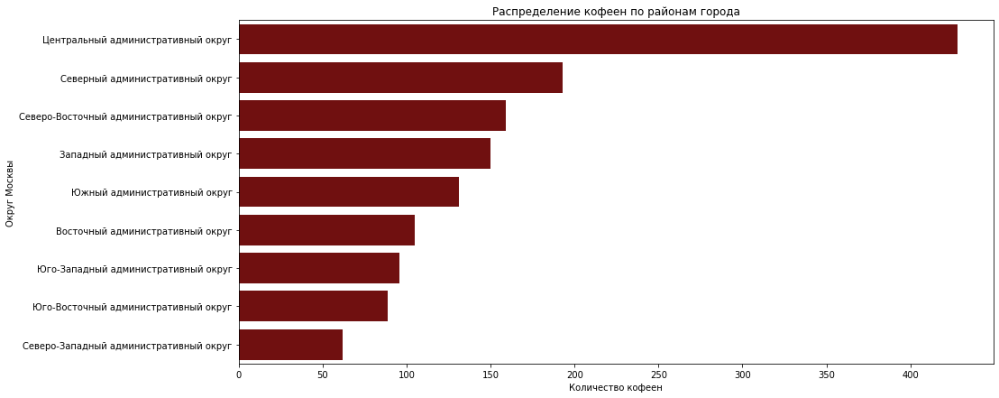

In [64]:
#визуализируем данные
plt.figure(figsize=(15, 7))
sns.barplot(x='district', y='index', data=coffee_cnt, color='maroon')
plt.xlabel('Количество кофеен')
plt.ylabel('Округ Москвы')
plt.title('Распределение кофеен по районам города')
plt.show()

In [65]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house.apply(create_clusters, axis=1)

# выводим карту
m

In [66]:
#посмотрим на наиболее популярные улицы
coffee_house['street'].value_counts().head(15)

проспект Мира             36
Ленинградский проспект    25
Ленинский проспект        23
Профсоюзная улица         18
Каширское шоссе           16
проспект Вернадского      16
Варшавское шоссе          14
Ленинградское шоссе       13
Кутузовский проспект      13
Новослободская улица      13
Новодмитровская улица     12
Дмитровское шоссе         11
Люблинская улица          11
улица Вавилова            10
Береговой проезд           9
Name: street, dtype: int64

Всего в Москве 1413 кофеен. Больше всего в Центральном округе - 428, также популярен Север города для открытия кофейни, меньше всего - на Юге. Наиболее часто кофейни встречаются на длинных улицах и проспектах, на перекрестках, где большое скопление людей. 

### Режим работы

In [67]:
#посмотрим, каккие режимы работы наиболее популярны
coffee_house['hours'].value_counts().sort_values(ascending=False).head(15)

ежедневно, 10:00–22:00                  140
ежедневно, 08:00–22:00                   60
ежедневно, круглосуточно                 59
ежедневно, 09:00–22:00                   57
пн-пт 08:00–19:00                        46
пн-пт 08:00–21:00; сб,вс 09:00–21:00     46
ежедневно, 09:00–21:00                   43
пн-пт 08:00–22:00; сб,вс 09:00–22:00     42
ежедневно, 08:00–21:00                   36
пн-пт 08:00–18:30                        34
ежедневно, 08:00–23:00                   29
ежедневно, 07:00–22:00                   25
пн-пт 08:00–22:00; сб,вс 10:00–22:00     25
ежедневно, 08:00–20:00                   23
ежедневно, 10:00–21:00                   19
Name: hours, dtype: int64

Чаще всего кофейни работают ежедневно с 8-10 утра и до 21-22 вечера. В тройку лидеров также входит режим работы "ежедневно, круглосуточно", таких точек 59 по городу. Отметим их на карте, посмотрим расположение.

In [68]:
#сделаем срез по столбцу 'is_24/7'
coffee_24_7 = coffee_house[coffee_house['is_24/7'] == True]
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
m1

Подавляющее большинство круглосуточных кофеен расположено в центре города, в том числе из-за расположения ж/д вокзалов в этой части города, кофеен с круглосуточным режимом работы у одного вокзала может быть сразу несколько. В остальных районах это практически не распространено

### Рейтинги

In [69]:
#распределение рейтингов кофеен по округам
rating_coffee = (coffee_house
                 .groupby('district', as_index=False)['rating'].agg('mean')
                 .round(2)
                 .sort_values(by='rating', ascending=False)
                )
rating_coffee

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [70]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m2)

# выводим карту
m2

Наиболее высокие оценки имеют кофейни в Центральном и Северо-Западном округах - средняя оценка 4.33-4.34. Самый низкий рейтинг у кофеен в Западном округе - 4.2.

Также давайте посмотрим на общие рейтинги среди сетевых и несетевых заведений:

In [71]:
#рейтинг сетевых кофеен
coffee_house.query('chain == 1')['rating'].mean()

4.2068055555555555

In [72]:
#рейтинг несетевых кофеен
coffee_house.query('chain == 0')['rating'].mean()

4.35050505050505

In [73]:
coffee_house.query('chain == 1')['name'].value_counts().head(50)

ШОКОЛАДНИЦА                   119
ONE PRICE COFFEE               71
COFIX                          65
КОФЕПОРТ                       42
COFEFEST                       31
КОФЕМАНИЯ                      22
CINNABON                       20
ПРАВДА КОФЕ                    13
KRISPY KREME                    9
UDCКАФЕ                         8
ДАБЛБИ                          8
WILD BEAN CAFE                  8
COFFEEKALDI'S                   8
9 BAR COFFEE                    7
БУХАНКА                         6
TAKE AND WAKE                   6
ЭЛЬ КАФЕ                        6
WILD BEAN                       5
COFFEE MOOSE                    4
ABC COFFEE ROASTERS             4
7 СЭНДВИЧЕЙ                     4
STAR HIT CAFE                   4
В ПАРКЕ ВКУСНЕЕ                 4
COFFEE AND THE CITY             4
NOBA COFFEE                     4
КОФЕ ХАУЗ                       4
COFFEE BEAN                     4
SKURATOV, COFFEE ROASTERS       4
BODRERO                         4
КОФЕ С СОБОЙ  

Мы видим, что средняя оценка несетвых кофеен выше - 4.35, в то время как у сетевых только 4.2.

### Ценообразование

In [74]:
#посмотрим на разброс цен на чашку капучино
coffee_house['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Цены на чашку капучно колеблются от 60 до 1568 руб в зависимости от заведения. Средние и медианные значения - 175 и 170 руб соответственно.

In [75]:
#распределение стоимости чашки капучино по округам
price_coffee = (coffee_house
                 .groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
                 .round(2)
                 .sort_values(by='middle_coffee_cup', ascending=False)
                )
price_coffee

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [76]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Стоимость чашки капучино',
).add_to(m3)

# выводим карту
m3

Средняя стоимость чашки капучино дороже всего обходится в Юго-Западном округе - 198 руб, в Центральном и Западном округах - по 190 руб. В Восточном округе самый дешевый кофе, в среднем 135 руб за чашку капучино. В остальных районах средняя цена колеблется от 150 до 165 руб. При открытии нового заведения, для формирования цены стоимости чашки кофе, стоит ориентироваться на район, в котором вы открываете заведение.

Посмотрим на различия в общем среднем чеке и в среднем чеке на чашку капучино в разрезе сетевых/несетевых заведений. Есть ли существенная разница?

In [77]:
print('Средний чек в сетевых кофейнях:', coffee_house.query('chain == 1')['middle_avg_bill'].median())
print('Средняя стоимость чашки капучино в сетевых кофейнях:', coffee_house.query('chain == 1')['middle_coffee_cup'].median())

Средний чек в сетевых кофейнях: 575.0
Средняя стоимость чашки капучино в сетевых кофейнях: 154.5


In [78]:
print('Средний чек в несетевых кофейнях:', coffee_house.query('chain == 0')['middle_avg_bill'].median())
print('Средняя стоимость чашки капучино в несетевых кофейнях:', coffee_house.query('chain == 0')['middle_coffee_cup'].median())

Средний чек в несетевых кофейнях: 381.0
Средняя стоимость чашки капучино в несетевых кофейнях: 170.0


Средний чек в сетевых кофейнях на 50% выше, чем в несетевых (575 руб против 381 руб).Возможно, дело в том, что в сетевых кофейнях более разнообразная кухня, есть не только сладости или сэндвичи к кофе. А вот стоимость чашки капучино чуть выше в несетевых кофейнях - 170 руб против 155 руб в сетевых. Скорее всего сетевые кофейни могут сделать цену чуть ниже, зарабатывая на объеме и дополнительных позициях в меню.

### Посадочные места

In [79]:
#посмотрим распределние посадочных мест методом discribe()
coffee_house['seats'].describe()

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64

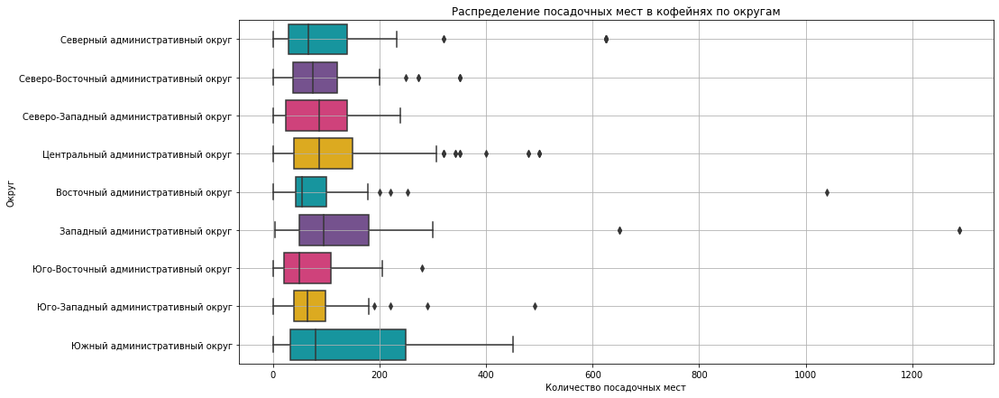

In [80]:
#построим боксплоты по округам
plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='district', data=coffee_house, palette=my_colors_2)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Округ')
plt.xlim()
plt.grid()
plt.title('Распределение посадочных мест в кофейнях по округам')
plt.show()

In [81]:
#выведем медианные значения по округам
(coffee_house
.groupby('district')['seats'].agg('median')
.round(2)
.sort_values(ascending=False))

district
Западный административный округ            96.0
Северо-Западный административный округ     87.5
Центральный административный округ         86.0
Южный административный округ               80.0
Северо-Восточный административный округ    75.0
Северный административный округ            66.0
Юго-Западный административный округ        64.5
Восточный административный округ           55.0
Юго-Восточный административный округ       50.0
Name: seats, dtype: float64

В среднем самые большие кофейни в Западном округе - на 96 мест, Северо-Запад и центр занимают второе и третье место - 88 и 86 мест. Самые небольшие кофейни на Востоке и Юго-Востоке - 50-55 мест. Медианным значением по общему числу кофеен можно считать 80 мест.

### Выводы и рекомендации

При открытии новой кофейни важно учесть следующие нюансы:
- местоположение: должна быть хорошая проходимость, транспортная доступность (центр города с туристами, возле достопримечательностей, парков, рядом с метро, на оживленной артерии города);
- лучше открывать кофейню со своей изюминкой, так называемую «крафтовую» кофейню, чтобы иметь преимущество среди конкурентов. В будущем можно будет рассмотреть вариант по созданию сети кофеен, но с разными концепциями
- при открытии кофейни рядом с популярными достопримечательностями, крупными учебными заведениями стоить увеличить число посадочных мест. В случае открытия в менее проходимых, но престижных районах города лучше селать ацент на эксклюзивность и сервис, количество посадочных мест может быть ниже среднего;
- при ценообразовании лучше ориентироваться на среднюю цену по району, на первое время можно запустить акцию по сниженной стоимости. Также в меню рекомендуем добавить несложные позиции по меню для завтраков и ланчей, чтобы помимо кофе была возможность перекусить и не только привычной выпечкой;
- режим работы можно выбрать круглосуточный (таких заведений совсем немного и в оживленном районе города они будут пользоваться спросом в любое время) или с 8 утра до 22-23 вечера; 

По расположению можем порекомендовать следующие районы:
- Центр города. Из плюсов: высокая проходимость, много туристов, достопримечательностей рядом, концентрация вокзалов с большим потоком людей, ценник можно сделать выше среднего и это будет нормально, так как это самый оживленный район с большим количеством пешеходных улиц и не спит в ночное время, отлично подойдет режим работы 24/7. Минусы: высокая стоимость аренды и огромная конкуренции, высокий рейтинг заведений; 
- Западный округ. Плюсы: В данный округ входят престижные районы города и соответственно присутствует платежеспособная публика, высокий средний чек в заведениях и низкий рейтинг поможет привлечь большее количество клиентов. Практически отсутствуют кофейни 24/7. Минусы: меньше проходимость, чем в центре, престижны районы города также подразумевают высокую стоимость на аренду. Данный округ считаем наиболее перспективным для открытия нового заведения;
- Юго-Западный округ. Плюсы: высокая средняя стоимость чашки кофе позволит иметь хорошую маржинальность, один из самых густонаселенных районов города с крупными магистралями, количество кофеен уже значительно меньше, то есть меньше конкуренция. Минусы: мало туристов, больше спальных районов.

Ссылка на презентацию: https://disk.yandex.ru/i/5Zspm4dunHgC8Q